In [32]:
import keras_cv
from tensorflow import keras
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
from glob import glob
import tensorflow.experimental.numpy as tnp
from keras_cv.models.stable_diffusion.noise_scheduler import NoiseScheduler
from tqdm import tqdm
import cv2
from tqdm import trange
from sklearn.decomposition import PCA
import matplotlib as mpl

from IPython.display import Image as IImage
from PIL import Image

# Keras example

In [7]:
keras.mixed_precision.set_global_policy("mixed_float16")

# Instantiate the Stable Diffusion model
model = keras_cv.models.StableDiffusion(jit_compile=True)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE


In [8]:
prompt_1 = "A watercolor painting of a Golden Retriever at the beach"
prompt_2 = "A still life DSLR photo of a bowl of fruit"
interpolation_steps = 5

encoding_1 = tf.squeeze(model.encode_text(prompt_1))
encoding_2 = tf.squeeze(model.encode_text(prompt_2))

interpolated_encodings = tf.linspace(encoding_1, encoding_2, interpolation_steps)

# Show the size of the latent manifold
print(f"Encoding shape: {encoding_1.shape}")


1356917/1356917 [==============================] - 0s 0us/step


2023-02-22 09:59:17.598201: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-02-22 09:59:17.748246: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-22 09:59:17.748418: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-22 09:59:17.748565: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least on

492466864/492466864 [==============================] - 38s 0us/step


2023-02-22 09:59:59.817263: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x55bbea3ad180 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-02-22 09:59:59.817311: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): NVIDIA RTX A5000, Compute Capability 8.6
2023-02-22 09:59:59.817318: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (1): NVIDIA RTX A5000, Compute Capability 8.6
2023-02-22 09:59:59.893326: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-02-22 10:00:02.538657: I tensorflow/compiler/jit/xla_compilation_cache.cc:477] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Encoding shape: (77, 768)


In [9]:
seed = 12345
noise = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

images = model.generate_image(
    interpolated_encodings,
    batch_size=interpolation_steps,
    diffusion_noise=noise,
)


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089
3439090152/3439090152 [==============================] - 328s 0us/step


2023-02-22 10:05:51.760443: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8302
2023-02-22 10:05:52.626510: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:5340] Disabling cuDNN frontend for the following convolution:
  input: {count: 5 feature_map_count: 4 spatial: 64 64  value_min: 0.000000 value_max: 0.000000 layout: BatchYXDepth}
  filter: {output_feature_map_count: 320 input_feature_map_count: 4 layout: OutputYXInput shape: 3 3 }
  {zero_padding: 1 1  pad_alignment: default filter_strides: 1 1  dilation_rates: 1 1 }
  ... because it uses an identity activation.
2023-02-22 10:05:53.522861: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:5340] Disabling cuDNN frontend for the following convolution:
  input: {count: 5 feature_map_count: 320 spatial: 64 64  value_min: 0.000000 value_max: 0.000000 layout: BatchYXDepth}
  filter: {output_feature_map_count: 320 input_feature_map_count: 320 layout: OutputYXInput shape: 3 3 }
  {z

2023-02-22 10:05:53.728971: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:5340] Disabling cuDNN frontend for the following convolution:
  input: {count: 5 feature_map_count: 1920 spatial: 16 16  value_min: 0.000000 value_max: 0.000000 layout: BatchYXDepth}
  filter: {output_feature_map_count: 1280 input_feature_map_count: 1920 layout: OutputYXInput shape: 3 3 }
  {zero_padding: 1 1  pad_alignment: default filter_strides: 1 1  dilation_rates: 1 1 }
  ... because it uses an identity activation.
2023-02-22 10:05:53.742372: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:5340] Disabling cuDNN frontend for the following convolution:
  input: {count: 5 feature_map_count: 1920 spatial: 16 16  value_min: 0.000000 value_max: 0.000000 layout: BatchYXDepth}
  filter: {output_feature_map_count: 1280 input_feature_map_count: 1920 layout: OutputYXInput shape: 1 1 }
  {zero_padding: 0 0  pad_alignment: default filter_strides: 1 1  dilation_rates: 1 1 }
  ... because it uses an

198180272/198180272 [==============================] - 24s 0us/step


2023-02-22 10:06:52.037988: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:5340] Disabling cuDNN frontend for the following convolution:
  input: {count: 5 feature_map_count: 4 spatial: 64 64  value_min: 0.000000 value_max: 0.000000 layout: BatchYXDepth}
  filter: {output_feature_map_count: 4 input_feature_map_count: 4 layout: OutputYXInput shape: 1 1 }
  {zero_padding: 0 0  pad_alignment: default filter_strides: 1 1  dilation_rates: 1 1 }
  ... because it uses an identity activation.
2023-02-22 10:06:52.043579: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:5340] Disabling cuDNN frontend for the following convolution:
  input: {count: 5 feature_map_count: 4 spatial: 64 64  value_min: 0.000000 value_max: 0.000000 layout: BatchYXDepth}
  filter: {output_feature_map_count: 512 input_feature_map_count: 4 layout: OutputYXInput shape: 3 3 }
  {zero_padding: 1 1  pad_alignment: default filter_strides: 1 1  dilation_rates: 1 1 }
  ... because it uses an identity activa

2023-02-22 10:06:53.847503: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:5340] Disabling cuDNN frontend for the following convolution:
  input: {count: 5 feature_map_count: 128 spatial: 512 512  value_min: 0.000000 value_max: 0.000000 layout: BatchYXDepth}
  filter: {output_feature_map_count: 128 input_feature_map_count: 128 layout: OutputYXInput shape: 3 3 }
  {zero_padding: 1 1  pad_alignment: default filter_strides: 1 1  dilation_rates: 1 1 }
  ... because it uses an identity activation.
2023-02-22 10:06:53.932023: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:5340] Disabling cuDNN frontend for the following convolution:
  input: {count: 5 feature_map_count: 128 spatial: 512 512  value_min: 0.000000 value_max: 0.000000 layout: BatchYXDepth}
  filter: {output_feature_map_count: 3 input_feature_map_count: 128 layout: OutputYXInput shape: 3 3 }
  {zero_padding: 1 1  pad_alignment: default filter_strides: 1 1  dilation_rates: 1 1 }
  ... because it uses an ide

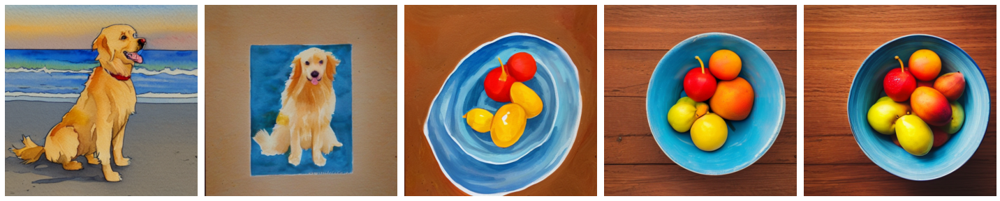

In [16]:
fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images)):
    axs[i].imshow(images[i])
    axs[i].axis('off')
    

plt.tight_layout()    
plt.show()

# Human faces

In [97]:
model = keras_cv.models.StableDiffusion(img_height=512, img_width=512,jit_compile=True)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE


In [100]:
prompt_1 = "A happy 30 years old asian baby with glasses posing for a photo to put in his cv"
prompt_2 = "A happy 50 years old brown old woman without glasses posing for a photo to put in her cv"
interpolation_steps = 5

encoding_1 = tf.squeeze(model.encode_text(prompt_1))
encoding_2 = tf.squeeze(model.encode_text(prompt_2))

interpolated_encodings = tf.linspace(encoding_1, encoding_2, interpolation_steps)

# Show the size of the latent manifold
print(f"Encoding shape: {encoding_1.shape}")

Encoding shape: (77, 768)


In [136]:
seed = 12345
noise = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

images = model.generate_image(
    interpolated_encodings,
    batch_size=interpolation_steps,
    diffusion_noise = noise
)

50/50 [==============================] - 17s 347ms/step


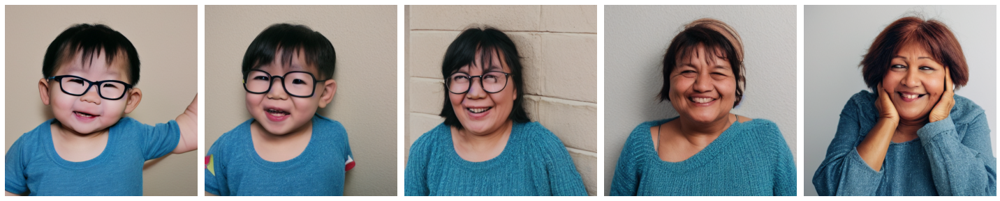

In [137]:
fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images)):
    axs[i].imshow(images[i])
    axs[i].axis('off')
    

plt.tight_layout()    
plt.show()

In [140]:
noise.shape,interpolated_encodings.shape,images.shape

(TensorShape([64, 64, 4]), TensorShape([5, 77, 768]), (5, 512, 512, 3))

In [5]:
prompts = []
for c in ['white','black','brown','asian']:
    for old in ['baby','kid','child','yound woman','young man','man','woman','old man','old woman']:
        for feel in ['happy','sad','angry','satisfied','nervous','calm','serious']:
            for glasses in ['with glasses','without glasses']:
                for age in range(1,80):
                    prompts.append(f"A {feel} {age} years old {c} {old} {glasses} posing for a photo to put in his cv")

In [ ]:
interpolation_steps = 10
seed = 12345

for times in range(1000):
    print(times)
    prompt_1,prompt_2 = np.random.choice(prompts,2)

    encoding_1 = tf.squeeze(model.encode_text(prompt_1))
    encoding_2 = tf.squeeze(model.encode_text(prompt_2))
    interpolated_encodings = tf.linspace(encoding_1, encoding_2, interpolation_steps)
    
    noise = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

    images = model.generate_image(
        interpolated_encodings,
        batch_size=interpolation_steps,
        diffusion_noise = noise
    )
    
    done = len(glob('./datasets/stable_diffusion/encodings/*'))
    
    for i in range(interpolation_steps):
        np.save(f'./datasets/stable_diffusion/encodings/{i+done}.npy',interpolated_encodings[i].numpy())
        np.save(f'./datasets/stable_diffusion/images/{i+done}.npy',images[i])

## Reverse the network

In [2]:
"""
Creating the model
"""
def conv_block(x, n_filt, size_conv=(5,5), n_conv=3):
    """
    Applies n_conv convolutions to the input with specified size and number of filters.
    """
    for c in range(n_conv):
        x = tf.keras.layers.Conv2D(n_filt, size_conv, padding="same", activation=None)(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Activation('relu')(x)
    return x

def u_encoder(x, n_filt):
    """
    Applies conv_block and returnes max pooled and skip-connection.
    """
    x = conv_block(x, n_filt)
    return tf.keras.layers.MaxPool2D()(x)

def u_decoder(pooled, skipped, n_filt):
    """
    Upsamples pooled and concats with skiped.
    """
    upsampled = tf.keras.layers.Convolution2DTranspose(n_filt, (2,2), strides=(2,2), padding='same')(pooled)
    return conv_block(upsampled, n_filt)
    
part = 2
    
def make_unet(inp, depth=3, output_channels=1):
    skipped = []
    p = inp
    for _ in range(depth):
        p = u_encoder(p, 3**(1+_))
    p = conv_block(p, 3)
    p = tf.keras.layers.Flatten()(p)
    p = tf.keras.layers.Dense(77*768//(2**(2+part)),activation='relu')(p)
    p = tf.keras.layers.Dense(77*768//(2**part),activation='relu')(p)
    p = tf.keras.layers.Reshape((77,768//(2**part),1))(p)
    for _ in reversed(range(part)):
        p = tf.keras.layers.Convolution2DTranspose(3**(2+_), (1,2), strides=(1,2), padding='same')(p)
        
    p = tf.keras.layers.Conv2D(output_channels, (1,1), activation='linear')(p)
    
    return p

def get_model(inp):
    """
    Takes network Input layer 
    """
    outp = make_unet(inp)
    return tf.keras.models.Model(inp, outp)

In [3]:
def open_frame(dataset):
    path = './datasets/stable_diffusion'
    chosen = np.random.choice(dataset)
    enc = np.load(f'{path}/encodings/{chosen.split("/")[-1]}')
    im = np.load(chosen)
    im = cv2.resize(im,(CROP,CROP))/255
        
    
    return enc,im

In [4]:
def sample_images(dataset):
    while True:
        try:
            
            enc,im = open_frame(dataset)
            
        except Exception as e:
            print(f'Exception {e} on file')
            #continue
            break
            
        
        yield enc,im

In [5]:
def get_data_generator(sampler):
    def get_data():
        while True:
            x = next(sampler)
            
            yield x
                    
    return get_data

In [6]:
path = './datasets/stable_diffusion'
dataset = glob(f'{path}/images/*')
CROP = 128
BATCH_SIZE = 5


dg_train = tf.data.Dataset.from_generator(
    get_data_generator(sample_images(dataset[:int(0.8*len(dataset))])),
    output_types=(tf.float32,tf.float32),
    output_shapes=((77,768),(CROP,CROP,3)) )

dg_val = tf.data.Dataset.from_generator(
    get_data_generator(sample_images(dataset[int(0.8*len(dataset)):])),
    output_types=(tf.float32,tf.float32),
    output_shapes=((77,768),(CROP,CROP,3)) )

gen_batch_train = dg_train.batch(BATCH_SIZE)
gen_batch_val = dg_val.batch(BATCH_SIZE)

2023-02-22 21:26:24.789698: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-22 21:26:24.789904: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-22 21:26:24.816239: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-22 21:26:24.816465: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-22 21:26:24.816631: I tensorflow/compiler/xla/stream_executo

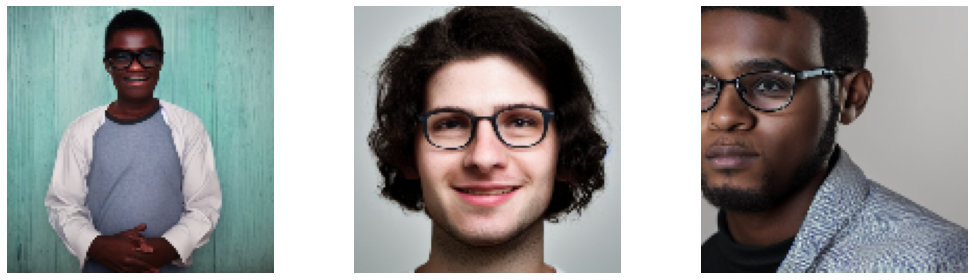

In [7]:
encoding,images = next(gen_batch_train.as_numpy_iterator())


fig,axs = plt.subplots(ncols=3,figsize=(15,4))

for i in range(3):
    axs[i].imshow(images[i])
    axs[i].axis('off')
    
plt.tight_layout()
plt.show()

In [8]:
encoder = get_model(tf.keras.layers.Input(shape=(CROP, CROP, 3)))
StableDiffusion = keras_cv.models.StableDiffusion(img_height=CROP, img_width=CROP,jit_compile=True)

encoder.compile(optimizer="adam", loss="mse")


vae=tf.keras.Model(
        StableDiffusion.image_encoder.input,
        StableDiffusion.image_encoder.layers[-2].output,
    )

for layer in vae.layers:
    layer.trainable = False
    
noise_scheduler=NoiseScheduler()


By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE
Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


In [9]:
def get_timestep_embedding(timestep, dim=320, max_period=10000):
    half = dim // 2
    log_max_preiod = tf.math.log(tf.cast(max_period, tf.float32))
    freqs = tf.math.exp(
        -log_max_preiod * tf.range(0, half, dtype=tf.float32) / half
    )
    args = tf.convert_to_tensor([timestep], dtype=tf.float32) * freqs
    embedding = tf.concat([tf.math.cos(args), tf.math.sin(args)], 0)
    embedding = tf.reshape(embedding, [1, -1])
    return embedding

In [10]:
prompts = []
for c in ['white','black','brown','asian']:
    for old in ['baby','kid','child','yound woman','young man','man','woman','old man','old woman']:
        for feel in ['happy','sad','angry','satisfied','nervous','calm','serious']:
            for glasses in ['with glasses','without glasses']:
                for age in range(1,80):
                    prompts.append(f"A {feel} {age} years old {c} {old} {glasses} posing for a photo to put in his cv")

In [ ]:
best = 1e16


history = []

for epoch in range(100):
    t = trange(100, desc='Error', leave=True)

    history.append([])

    for i in t:

        interpolated_encodings,Y = next(gen_batch_train.as_numpy_iterator())


        with tf.GradientTape() as tape:
            X = tf.squeeze(encoder(Y,training=True))

            outputs = vae(Y, training=False)
            mean, logvar = tf.split(outputs, 2, axis=-1)

            logvar = tf.clip_by_value(logvar, -30.0, 20.0)
            std = tf.exp(0.5 * logvar)
            sample = tf.random.normal(tf.shape(mean), dtype=mean.dtype)
            latents =  mean + std * sample

            latents = latents * 0.18215
            noise = tf.random.normal(tf.shape(latents))
            timesteps = tnp.random.randint(
                            0, noise_scheduler.train_timesteps, (BATCH_SIZE,)
                        )

            noisy_latents = noise_scheduler.add_noise(
                            tf.cast(latents, noise.dtype), noise, timesteps
                        )


            timestep_embedding = tf.map_fn(
                lambda t: get_timestep_embedding(t), timesteps, dtype=tf.float32
            )
            timestep_embedding = tf.squeeze(timestep_embedding, 1)

            X = StableDiffusion.diffusion_model([noisy_latents, timestep_embedding, X], training=False)
            Y1 = StableDiffusion.diffusion_model([noisy_latents, timestep_embedding, interpolated_encodings], training=False)


            X = StableDiffusion.decoder(X,training=False)      
            Y1 = StableDiffusion.decoder(Y1,training=False)
            X,Y1 = tf.cast(X,dtype='float'),tf.cast(Y1,dtype='float')


            loss = tf.keras.metrics.mse(X,Y1)

        trainable_vars = encoder.trainable_variables
        gradients = tape.gradient(loss, trainable_vars)

        encoder.optimizer.apply_gradients(zip(gradients, trainable_vars))

        encoder.compiled_metrics.update_state(Y1, X)


        t.set_description(f"Error {int(100*np.mean(np.sum(loss,axis=(1,2))))/100}", refresh=True)

    X,Y1 = tf.clip_by_value(X,0,255),tf.clip_by_value(Y1,0,255)
    X,Y1 = tf.cast(X,dtype='int32'),tf.cast(Y1,dtype='int32')
    '''
    fig,axs = plt.subplots(ncols=3,nrows=2,figsize=(15,5))
    for j in range(3):
        _ = np.random.choice(BATCH_SIZE)
        axs[0,j].imshow(X[_])
        axs[0,j].axis('off')

        axs[1,j].imshow(Y1[_])
        axs[1,j].axis('off')

    plt.tight_layout()
    plt.show()
    '''
    L = []
    history[-1].append(int(100*np.mean(np.sum(loss,axis=(1,2))))/100)

    for i in range(5):
        interpolated_encodings,Y = next(gen_batch_val.as_numpy_iterator())

        X = tf.squeeze(encoder(Y,training=False))

        outputs = vae(Y, training=False)
        mean, logvar = tf.split(outputs, 2, axis=-1)

        logvar = tf.clip_by_value(logvar, -30.0, 20.0)
        std = tf.exp(0.5 * logvar)
        sample = tf.random.normal(tf.shape(mean), dtype=mean.dtype)
        latents =  mean + std * sample

        latents = latents * 0.18215
        noise = tf.random.normal(tf.shape(latents))
        timesteps = tnp.random.randint(
                        0, noise_scheduler.train_timesteps, (BATCH_SIZE,)
                    )

        noisy_latents = noise_scheduler.add_noise(
                        tf.cast(latents, noise.dtype), noise, timesteps
                    )


        timestep_embedding = tf.map_fn(
            lambda t: get_timestep_embedding(t), timesteps, dtype=tf.float32
        )
        timestep_embedding = tf.squeeze(timestep_embedding, 1)

        X = StableDiffusion.diffusion_model([noisy_latents, timestep_embedding, X], training=False)
        Y1 = StableDiffusion.diffusion_model([noisy_latents, timestep_embedding, interpolated_encodings], training=False)


        X = StableDiffusion.decoder(X,training=False)      
        Y1 = StableDiffusion.decoder(Y1,training=False)
        X,Y1 = tf.cast(X,dtype='float'),tf.cast(Y1,dtype='float')


        loss = tf.keras.metrics.mse(X,Y1)
        L.append(np.copy(loss))

    L = np.concatenate(L)

    if np.mean(np.sum(loss,axis=(1,2))) < best:
        best = np.mean(np.sum(L,axis=(1,2)))
        encoder.save_weights('./checkpoints/latent_space')
        
    history[-1].append(np.mean(np.sum(L,axis=(1,2))))

    print('best :',best)

# Other direction vectors

In [46]:
def export_as_gif(filename, images, frames_per_second=10, rubber_band=False):
    if rubber_band:
        images += images[2:-1][::-1]
    images[0].save(
        filename,
        save_all=True,
        append_images=images[1:],
        duration=1000 // frames_per_second,
        loop=0,
    )

In [33]:
CROP = 512

StableDiffusion = keras_cv.models.StableDiffusion(img_height=CROP, img_width=CROP,jit_compile=True)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE


## Aging

In [34]:
prompts_baby = []
for c in ['white']:
    for old in ['little girl']:
        for feel in ['happy']:
            for glasses in ['without glasses']:
                for age in [1,2,3,4]:
                    prompts_baby.append(f"A {feel} {age} years old {c} {old} {glasses} posing for a photo to put in his cv")
                    

prompts_girl = []
for c in ['white']:
    for old in ['little girl']:
        for feel in ['happy']:
            for glasses in ['without glasses']:
                for age in [1,2,3,4]:
                    prompts_girl.append(f"A {feel} {age} years old {c} {old} {glasses} posing for a photo to put in his cv")
                    
prompts_old_woman = []
for c in ['white']:
    for old in ['woman']:
        for feel in ['happy']:
            for glasses in ['without glasses']:
                for age in [50,60,70,80]:
                    prompts_old_woman.append(f"A {feel} {age} years old {c} {old} {glasses} posing for a photo to put in his cv")


In [7]:
baby = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_baby]))
girl = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_girl]))
ow = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_old_woman]))

aging = ow - baby
aging2 = ow - girl

aging = aging.reshape(len(aging),np.prod(aging.shape[1:]))
aging2 = aging2.reshape(len(aging2),np.prod(aging2.shape[1:]))

aging = aging/np.expand_dims(np.linalg.norm(aging,axis=-1),axis=-1)
aging2 = aging2/np.expand_dims(np.linalg.norm(aging2,axis=-1),axis=-1)


index = np.arange(len(aging))
np.random.shuffle(index)
ag = np.copy(aging[index])

angles = np.multiply(aging,ag)

angles = np.sum(angles,axis=-1)
angles = np.clip(angles,-1,1)

np.mean(180*np.arccos(angles)/np.pi),np.std(180*np.arccos(angles)/np.pi)

(32.513817, 20.784216)

In [41]:
prompts_woman = []

for age in np.arange(18,90,1):
    prompts_woman.append(f"A happy {age} years old woman posing for a photo to put in his cv")
    
prompts_man = []

for age in np.arange(18,90,1):
    prompts_man.append(f"A happy {age} years old man posing for a photo to put in his cv")


In [42]:
w = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_woman]))
w = w.reshape(len(w),np.prod(w.shape[1:]))

m = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_man]))
m = m.reshape(len(m),np.prod(m.shape[1:]))

In [43]:
pca = PCA(n_components = 1)

mean = np.expand_dims(np.mean(w,axis=-1),axis=-1)
std = np.expand_dims(np.std(w,axis=-1),axis=-1)
pca.fit((np.copy(w)-mean)/std)
a = pca.transform((np.copy(w)-mean)/std)

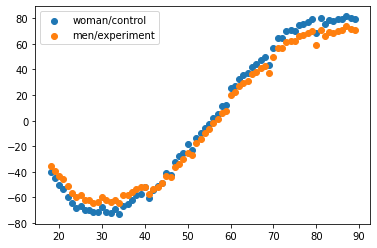

In [44]:
plt.scatter(np.arange(18,90,1),a.flatten(),label='woman/control')
plt.scatter(np.arange(18,90,1),np.sum(np.multiply(pca.components_,m),axis=-1),label='men/experiment')
plt.legend()
plt.show()

In [45]:
age_direction = pca.components_

In [101]:
p1 = 'A happy 20 years old man'
encoding = StableDiffusion.encode_text(p1)
interpolation = []
interpolation_steps = 60
batch_size = 3

seed = 12345
noise = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

for c in np.linspace(0,70,interpolation_steps):

    p2 = encoding + c*age_direction.reshape(encoding.shape)
    interpolation.append(np.copy(p2))
    
    
interpolation = np.array(interpolation)
interpolation = np.squeeze(interpolation)
interpolation = interpolation.reshape(interpolation_steps//batch_size,batch_size,77,768)

batches = interpolation_steps//batch_size

images = []
for batch in range(batches):
    images += [
        Image.fromarray(img)
        for img in StableDiffusion.generate_image(
            interpolation[batch],
            batch_size=batch_size,
            diffusion_noise=noise,
        )
    ]

50/50 [==============================] - 26s 517ms/step


In [102]:
for j,i in enumerate(images):
    i.save(f'./gifs/aging_{j}.png')

In [117]:
seed = 12345
noise_seed = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

images = StableDiffusion.generate_image(
    interpolation,
    batch_size=len(interpolation),
    diffusion_noise = noise_seed
)

50/50 [==============================] - 36s 720ms/step


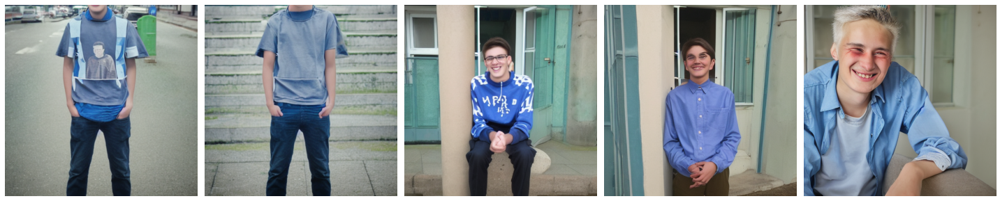

In [118]:
fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images)):
    axs[i].imshow(images[i])
    axs[i].axis('off')
    

plt.tight_layout()    
plt.show()

In [128]:
noise = np.array([StableDiffusion.image_encoder(images/255)[0]])
alpha = 0.01
noise = alpha*noise + (1-alpha)*noise_seed

interpolation2 = np.array([encoding + c*age_direction.reshape(encoding.shape) for c in [0,-20,40,50,60]])

images2 = StableDiffusion.generate_image(
    interpolation2,
    batch_size=len(interpolation2),
    diffusion_noise = noise,
    num_steps=50
)

50/50 [==============================] - 36s 715ms/step


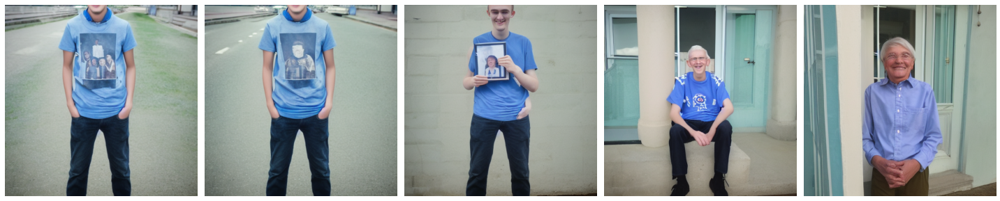

In [129]:
fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images2)):
    axs[i].imshow(images2[i])
    axs[i].axis('off')
    

plt.tight_layout()    
plt.show()

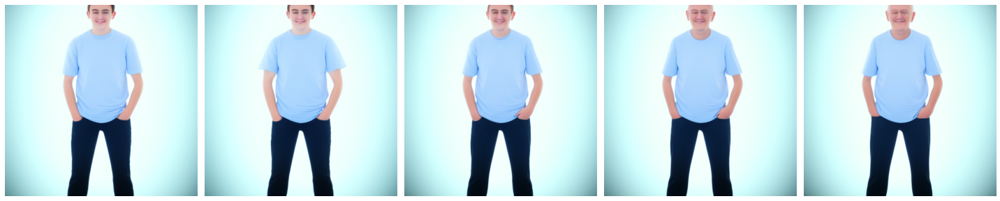

In [125]:
fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images2)):
    axs[i].imshow(images2[i])
    axs[i].axis('off')
    

plt.tight_layout()    
plt.show()

# Clothing color

In [140]:
colors = list(mpl.colors.cnames.keys())

prompts_woman = []
prompts_man = []

for color in colors:
    prompts_woman.append(f"A happy woman with a {color} shirt")
    
for color in colors:
    prompts_man.append(f"A happy man with a {color} shirt")

    
w = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_woman]))
w = w.reshape(len(w),np.prod(w.shape[1:]))
m = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_man]))
m = m.reshape(len(m),np.prod(m.shape[1:]))

pca = PCA(n_components = 1)

mean = np.expand_dims(np.mean(w,axis=-1),axis=-1)
std = np.expand_dims(np.std(w,axis=-1),axis=-1)
pca.fit((np.copy(w)-mean)/std)
a = pca.transform((np.copy(w)-mean)/std)

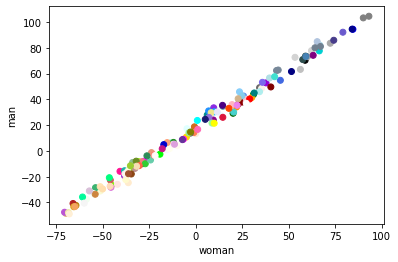

In [173]:
plt.scatter(a.flatten(),np.sum(np.multiply(pca.components_,m),axis=-1),color=colors)
plt.xlabel('woman')
plt.ylabel('man')
plt.show()

In [145]:
colors[np.argmin(a.flatten())],colors[np.argmax(a.flatten())]
color_direction = pca.components_

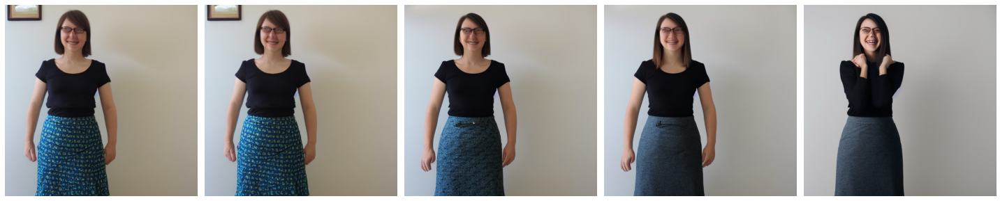

In [172]:
p1 = f"A happy woman with a {colors[np.argmin(a.flatten())]} skirt"
encoding = StableDiffusion.encode_text(p1)
interpolation = [encoding]

for c in np.linspace(0,np.amax(a.flatten())-np.amin(a.flatten()),4):

    p2 = encoding + c*color_direction.reshape(encoding.shape)
    interpolation.append(np.copy(p2))
    
interpolation = np.array(interpolation)


seed = 12345
noise_seed = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

images = StableDiffusion.generate_image(
    interpolation,
    batch_size=len(interpolation),
    diffusion_noise = noise_seed
)



fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images)):
    axs[i].imshow(images[i])
    axs[i].axis('off')
    

plt.tight_layout()    
plt.show()

# Landscapes

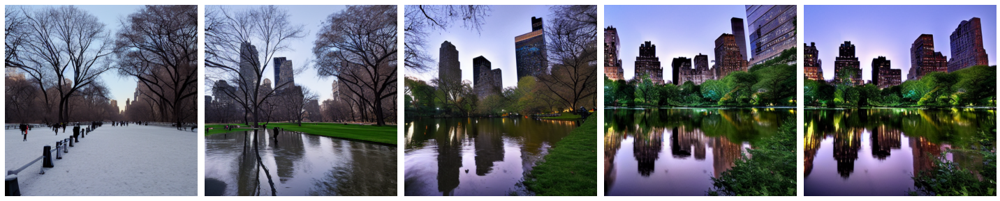

In [332]:
prompt_1 = "Central Park, New York at 09:00 am on January 15th"
prompt_2 = "Central Park, New York at 21:00 pm on July 15th"
interpolation_steps = 5

encoding_1 = tf.squeeze(StableDiffusion.encode_text(prompt_1))
encoding_2 = tf.squeeze(StableDiffusion.encode_text(prompt_2))

interpolation = tf.linspace(encoding_1, encoding_2, interpolation_steps)

seed = 12345
noise_seed = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

images = StableDiffusion.generate_image(
    interpolation,
    batch_size=len(interpolation),
    diffusion_noise = noise_seed
)


fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images)):
    axs[i].imshow(images[i])
    axs[i].axis('off')
    

plt.tight_layout()    
plt.show()

In [320]:
prompts_cp = []
prompts_ts = []
months = ['January','February','March',
          'April','May','June','July','August',
          'September','October','November','December']

for month in months:
    for day in range(1,29):
        prompts_cp.append(f"Central Park, New York at 09:00 am on {month} {day}th")
        prompts_ts.append(f"Times Square, New York at 09:00 am on {month} {day}th")
        
cp = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_cp]))
cp = cp.reshape(len(cp),np.prod(cp.shape[1:]))

ts = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_ts]))
ts = ts.reshape(len(ts),np.prod(ts.shape[1:]))

pca = PCA(n_components = 1)

mean = np.expand_dims(np.mean(cp,axis=-1),axis=-1)
std = np.expand_dims(np.std(cp,axis=-1),axis=-1)
pca.fit((np.copy(cp)-mean)/std)
a = pca.transform((np.copy(cp)-mean)/std)

direction = pca.components_

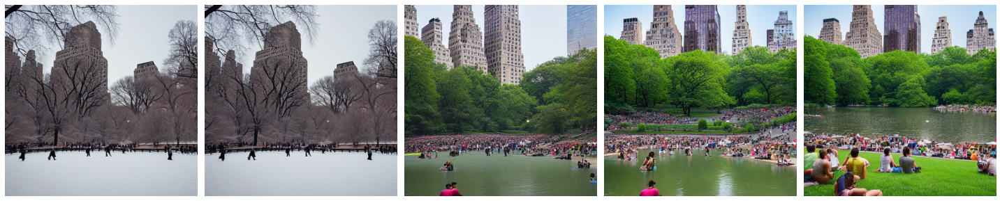

In [322]:
p1 = f"Central Park, New York at 09:00 am on {months[0]} {1}th"
encoding = StableDiffusion.encode_text(p1)
interpolation = [encoding]

for c in len(prompts_cp)//4*np.arange(4):

    p2 = encoding + c*direction.reshape(encoding.shape)
    interpolation.append(np.copy(p2))
    
interpolation = np.array(interpolation)

seed = 12345
noise_seed = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

images = StableDiffusion.generate_image(
    interpolation,
    batch_size=len(interpolation),
    diffusion_noise = noise_seed
)

fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images)):
    axs[i].imshow(images[i])
    axs[i].axis('off')
    

plt.tight_layout()    
plt.show()

50/50 [==============================] - 36s 721ms/step


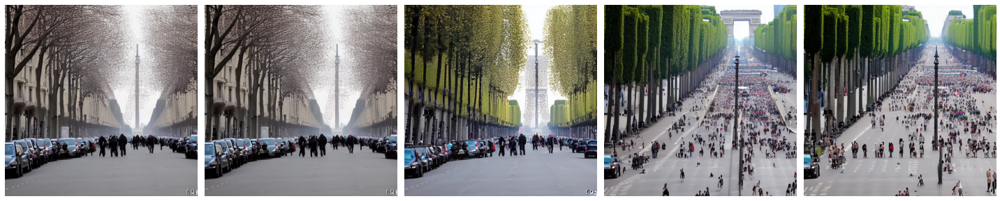

In [329]:
p1 = f"Champs Elysees, Paris at 09:00 am on {months[0]} {1}th"
encoding = StableDiffusion.encode_text(p1)
interpolation = [encoding]

for c in len(prompts_cp)//4*np.arange(4):

    p2 = encoding + c*direction.reshape(encoding.shape)
    interpolation.append(np.copy(p2))
    
interpolation = np.array(interpolation)

seed = 12345
noise_seed = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

images = StableDiffusion.generate_image(
    interpolation,
    batch_size=len(interpolation),
    diffusion_noise = noise_seed
)

fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images)):
    axs[i].imshow(images[i])
    axs[i].axis('off')
    

plt.tight_layout()    
plt.show()

In [117]:
prompts_cp = []
prompts_ts = []
hours = [f'0{i}' for i in range(10)]
hours = np.concatenate((hours,[f'{i}' for i in range(10,24)]))
minutes = [f'0{i}' for i in range(10)]
minutes = np.concatenate((minutes,[f'{i}' for i in range(10,60)]))

for hour in hours:
    for minute in minutes:
        prompts_cp.append(f"Central Park, New York at {hour}:{minute} on July 15th")
        prompts_ts.append(f"Times Square, New York at {hour}:{minute} on July 15th")

cp = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_cp]))
cp = cp.reshape(len(cp),np.prod(cp.shape[1:]))

ts = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_ts]))
ts = ts.reshape(len(ts),np.prod(ts.shape[1:]))

pca_hours = PCA(n_components = 1)

mean = np.expand_dims(np.mean(cp,axis=-1),axis=-1)
std = np.expand_dims(np.std(cp,axis=-1),axis=-1)
pca_hours.fit((np.copy(cp)-mean)/std)

direction_hours = pca_hours.components_

50/50 [==============================] - 36s 721ms/step


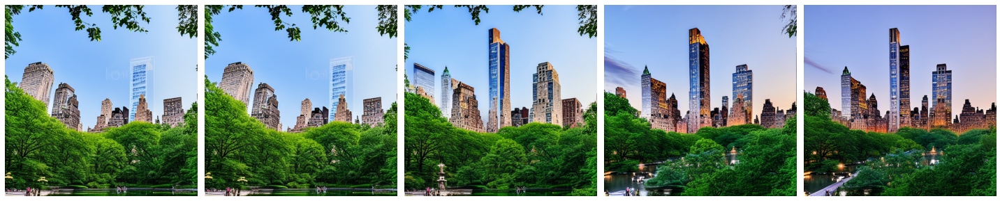

In [111]:
p1 = f"Central Park, New York at 06:00 on July 15th"
encoding = StableDiffusion.encode_text(p1)
interpolation = [encoding]

for c in 20*np.arange(4):

    p2 = encoding + c*direction_hours.reshape(encoding.shape)
    interpolation.append(np.copy(p2))
    
interpolation = np.array(interpolation)

seed = 12345
noise_seed = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

images = StableDiffusion.generate_image(
    interpolation,
    batch_size=len(interpolation),
    diffusion_noise = noise_seed
)

fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images)):
    axs[i].imshow(images[i])
    axs[i].axis('off')
    

plt.tight_layout()    
plt.show()

50/50 [==============================] - 36s 717ms/step


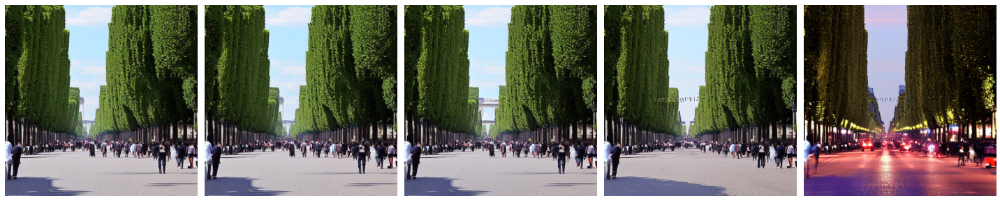

In [118]:
p1 = f"Champs Elysees, Paris at 09:00 on July 15th"
encoding = StableDiffusion.encode_text(p1)
interpolation = [encoding]

for c in 20*np.arange(4):

    p2 = encoding + c*direction_hours.reshape(encoding.shape)
    interpolation.append(np.copy(p2))
    
interpolation = np.array(interpolation)

seed = 12345
noise_seed = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

images = StableDiffusion.generate_image(
    interpolation,
    batch_size=len(interpolation),
    diffusion_noise = noise_seed
)

fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images)):
    axs[i].imshow(images[i])
    axs[i].axis('off')
    

plt.tight_layout()    
plt.show()

In [122]:
prompts_cp = []
prompts_ts = []
months = ['January','February','March',
          'April','May','June','July','August',
          'September','October','November','December']

for month in months:
    for day in range(1,29):
        prompts_cp.append(f"Central Park, New York at 09:00 am on {month} {day}th")
        prompts_ts.append(f"Times Square, New York at 09:00 am on {month} {day}th")
        
cp = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_cp]))
cp = cp.reshape(len(cp),np.prod(cp.shape[1:]))

ts = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_ts]))
ts = ts.reshape(len(ts),np.prod(ts.shape[1:]))

pca_months = PCA(n_components = 1)

mean = np.expand_dims(np.mean(cp,axis=-1),axis=-1)
std = np.expand_dims(np.std(cp,axis=-1),axis=-1)
pca_months.fit((np.copy(cp)-mean)/std)

direction_months = pca_months.components_

50/50 [==============================] - 36s 721ms/step


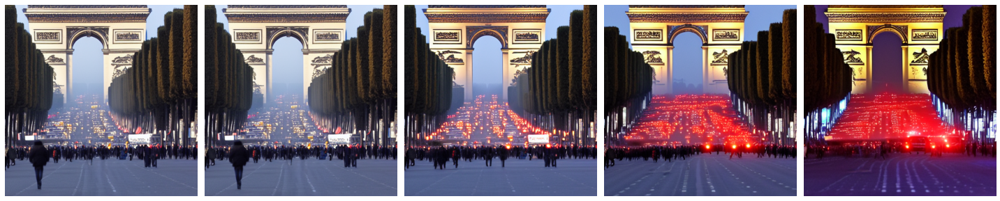

In [129]:
p1 = f"Champs Elysees, Paris at 09:00 on January 1th"
encoding = StableDiffusion.encode_text(p1)
interpolation = [encoding]

for c in np.arange(4):

    p2 = encoding + c*(20*direction_hours.reshape(encoding.shape) + 10*direction_months.reshape(encoding.shape))
    interpolation.append(np.copy(p2))
    
interpolation = np.array(interpolation)

seed = 12345
noise_seed = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

images = StableDiffusion.generate_image(
    interpolation,
    batch_size=len(interpolation),
    diffusion_noise = noise_seed
)

fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images)):
    axs[i].imshow(images[i])
    axs[i].axis('off')
    

plt.tight_layout()    
plt.show()

## Hair

In [385]:
prompts_cp = []
prompts_ts = []

places = ['Libson','Madrid','Paris','Berlin','Rome','New York','Central Park','Times Square',
         'Eiffel Tower','Statue of Liberty','the park','the zoo','the aquarium','the beach',
         'the jungle','the desert','London']

for place in places:
    for long in ['very short', 'short','medium long','long','very long','incredibly long']:
        prompts_cp.append(f"A woman with {long} hair in {place}")
        
        
for place in places:
    for long in ['very short', 'short','medium long','long','very long','incredibly long']:
        prompts_ts.append(f"A man with {long} hair in {place}")
    
        
cp = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_cp]))
cp = cp.reshape(len(cp),np.prod(cp.shape[1:]))

ts = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_ts]))
ts = ts.reshape(len(ts),np.prod(ts.shape[1:]))

pca = PCA(n_components = 1)

mean = np.expand_dims(np.mean(cp,axis=-1),axis=-1)
std = np.expand_dims(np.std(cp,axis=-1),axis=-1)
pca.fit((np.copy(cp)-mean)/std)
a = pca.transform((np.copy(cp)-mean)/std)

direction = pca.components_

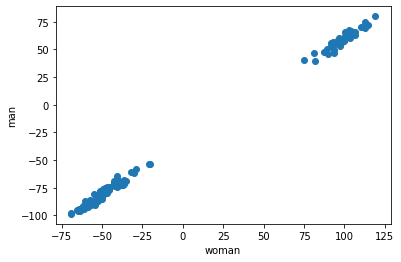

In [386]:
#plt.scatter(a[:,0].flatten(),np.sum(np.multiply(pca.components_[0],ts),axis=-1))
plt.scatter(a.flatten(),np.sum(np.multiply(pca.components_,ts),axis=-1))
plt.xlabel('woman')
plt.ylabel('man')
plt.show()

50/50 [==============================] - 36s 716ms/step


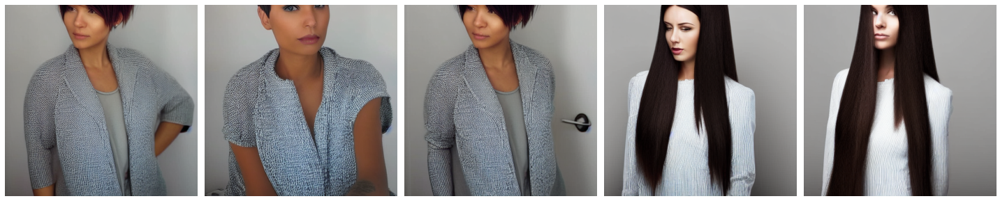

In [389]:
p1 = f"A woman with very short hair"
encoding = StableDiffusion.encode_text(p1)
interpolation = [encoding]

for c in 5*len(prompts_cp)//4*np.linspace(-1.5,0.5,4)[::-1]:

    p2 = encoding + c*direction.reshape(encoding.shape)
    interpolation.append(np.copy(p2))

interpolation = np.array(interpolation)

seed = 12345
noise_seed = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

images = StableDiffusion.generate_image(
    interpolation,
    batch_size=len(interpolation),
    diffusion_noise = noise_seed
)

fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images)):
    axs[i].imshow(images[i])
    axs[i].axis('off')


plt.tight_layout()    
plt.show()

50/50 [==============================] - 36s 710ms/step


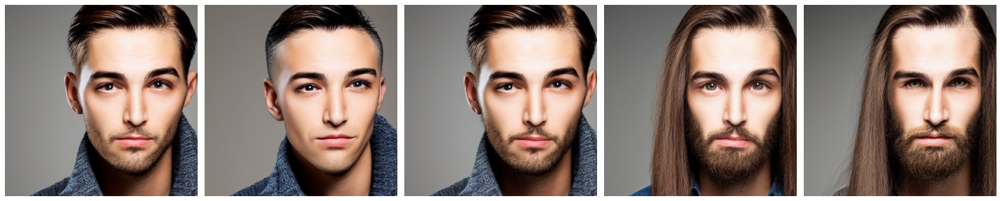

In [393]:
p1 = f"A man with very short hair"
encoding = StableDiffusion.encode_text(p1)
interpolation = [encoding]

for c in 5*len(prompts_cp)//4*np.linspace(-1.5,0.5,4)[::-1]:

    p2 = encoding + c*direction.reshape(encoding.shape)
    interpolation.append(np.copy(p2))

interpolation = np.array(interpolation)

seed = 12345
noise_seed = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

images = StableDiffusion.generate_image(
    interpolation,
    batch_size=len(interpolation),
    diffusion_noise = noise_seed
)

fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images)):
    axs[i].imshow(images[i])
    axs[i].axis('off')


plt.tight_layout()    
plt.show()

# Measuring distance

In [27]:
encodings = np.array(glob('./datasets/stable_diffusion/encodings/*'))
images = np.array(glob('./datasets/stable_diffusion/images/*'))

chosen = np.random.choice(len(encodings),30)
encodings = np.array([np.load(im) for im in encodings[chosen]])
images = np.array([np.load(im) for im in images[chosen]])
encoded = np.squeeze(np.array([StableDiffusion.image_encoder(np.array([im])/255) for im in images]))

In [28]:
distance_mean,distance_std = [],[]
partition = 3

for dist in tqdm(np.arange(0.001,0.1,0.01)):
    D = []
    for c in range(len(chosen)//partition):
        seed = 12345
        noise_seed = tf.random.normal((partition,512 // 8, 512 // 8, 4), seed=seed)
        
        noise = dist*encoded[partition*c:partition*(c+1)] + (1-dist)*noise_seed        
        
        
        reconstructed = StableDiffusion.generate_image(
            encodings[partition*c:partition*(c+1)],
            batch_size=partition,
            diffusion_noise = noise
        )
        
        d = np.power(reconstructed - images[partition*c:partition*(c+1)],2)
        d = np.sqrt(np.sum(d,axis=(1,2,3)))
        
        D.append(np.copy(d))
        
    distance_mean.append(np.mean(D))
    distance_std.append(np.std(D))


  0%|                                                    | 0/10 [00:00<?, ?it/s]

50/50 [==============================] - 26s 516ms/step


 10%|████▎                                      | 1/10 [04:20<39:08, 260.98s/it]

50/50 [==============================] - 26s 516ms/step


 20%|████████▌                                  | 2/10 [08:42<34:49, 261.15s/it]

50/50 [==============================] - 26s 517ms/step


 30%|████████████▉                              | 3/10 [13:03<30:28, 261.16s/it]

50/50 [==============================] - 26s 516ms/step


 40%|█████████████████▏                         | 4/10 [17:24<26:07, 261.19s/it]

50/50 [==============================] - 26s 516ms/step


 50%|█████████████████████▌                     | 5/10 [21:45<21:45, 261.18s/it]

50/50 [==============================] - 26s 516ms/step


 60%|█████████████████████████▊                 | 6/10 [26:07<17:24, 261.22s/it]

50/50 [==============================] - 26s 517ms/step


 70%|██████████████████████████████             | 7/10 [30:28<13:03, 261.23s/it]

50/50 [==============================] - 26s 516ms/step


 80%|██████████████████████████████████▍        | 8/10 [34:49<08:42, 261.24s/it]

50/50 [==============================] - 26s 516ms/step


 90%|██████████████████████████████████████▋    | 9/10 [39:11<04:21, 261.30s/it]

50/50 [==============================] - 26s 517ms/step


100%|██████████████████████████████████████████| 10/10 [43:32<00:00, 261.24s/it]


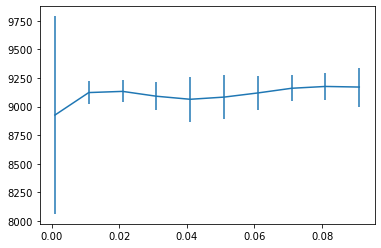

In [30]:
plt.errorbar(np.arange(0.001,0.1,0.01),distance_mean,distance_std)
plt.show()